In [0]:
import numpy as np 
import matplotlib as mpl
import matplotlib.pyplot as plt 
from  matplotlib import animation, rc
from matplotlib import patches as patches
import pandas as pd
import math

Load data from csv:

In [0]:
# load data file
csv = pd.read_csv('data.csv')

Clear province-wise entries and sum to single country entry:

In [4]:
invalid = []
i = 0
pd.options.mode.chained_assignment = None  # default='warn'
j=83
n0 = len(csv['Country/Region'])-1

while i < n0-j:
  # case where diff province but same country on same day
  if csv['Country/Region'][i]==csv['Country/Region'][i+j] and csv['Date'][i]==csv['Date'][i+j]:
    csv['Confirmed'][i] += csv['Confirmed'][i+j]
    csv['Deaths'][i] += csv['Deaths'][i+j]
    csv['Recovered'][i] += csv['Recovered'][i+j]
    invalid.append(i+j)
  i+=1

csv.drop(invalid, axis=0, inplace=True)
print("Invalid entries dropped.")

Invalid entries dropped.


In [0]:
# feature extraction from csv
dates = []
lats = []
longs = []
conf = []
rec = []
deaths = []
regions_all = []
regions = []

# removing discrepancies in data
for z in range(n0):
  # add data, making sure it is not deleted
  if z not in invalid and csv['Confirmed'][z] != -1 and csv['Recovered'][z] != -1 and csv['Deaths'][z] != -1:
    regions_all.append(csv['Country/Region'][z])
    dates.append(csv['Date'][z])
    lats.append(csv['Lat'][z].astype('float'))
    longs.append(csv['Long'][z].astype('float'))
    conf.append(csv['Confirmed'][z].astype('float'))
    rec.append(csv['Recovered'][z].astype('float'))
    deaths.append(csv['Deaths'][z].astype('float'))

# neural networks always tend to work better if the data is normalized:
mconf = max(conf)
mrec = max(rec)
mdeaths = max(deaths)
regions = list(dict.fromkeys(regions_all))

features_total = np.array([[conf[i]/mconf, rec[i]/mrec, deaths[i]/mdeaths, regions_all[i]] 
                     for i in range(len(regions_all))])

Remove Nan values and replace with 0:

In [0]:
for i in range(len(features_total)):
  for j in range(len(features_total[i])-1):
    if math.isnan(float(features_total[i][j])):
      features_total[i][j] = 0.0

Example of country wise data being summed along all provinces is Australia that had data of multiple states, now only is represented as one country.
It only shows 83 entries to its name:

In [7]:
csv.loc[csv['Country/Region']=='Australia']

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths
664,2020-01-22,Australia,Australian Capital Territory,-35.4735,149.0124,0.0,0.0,0.0
665,2020-01-23,Australia,Australian Capital Territory,-35.4735,149.0124,0.0,0.0,0.0
666,2020-01-24,Australia,Australian Capital Territory,-35.4735,149.0124,0.0,0.0,0.0
667,2020-01-25,Australia,Australian Capital Territory,-35.4735,149.0124,0.0,0.0,0.0
668,2020-01-26,Australia,Australian Capital Territory,-35.4735,149.0124,3.0,0.0,0.0
...,...,...,...,...,...,...,...,...
742,2020-04-09,Australia,Australian Capital Territory,-35.4735,149.0124,2873.0,51.0,23.0
743,2020-04-10,Australia,Australian Capital Territory,-35.4735,149.0124,2925.0,63.0,24.0
744,2020-04-11,Australia,Australian Capital Territory,-35.4735,149.0124,2960.0,63.0,25.0
745,2020-04-12,Australia,Australian Capital Territory,-35.4735,149.0124,2960.0,63.0,26.0


In [117]:
# select features corresponding to a certain date

def getEntriesPerDate(date):
  print("Date selected:", date)
  idxs = []
  for i in range(len(dates)):
    if dates[i] != date:
      idxs.append(i)
  return np.delete(np.delete(features_total, 3, 1), idxs, 0).astype('float')

sel_date = dates[-8]
features_sel_date = getEntriesPerDate(sel_date)
features_sel_date = np.nan_to_num(features_sel_date)

Date selected: 2020-04-05


The aforementioned date was chosen because there is all chosen clusters have representation in it.

In [13]:
features_sel_date.shape

(185, 3)

In [14]:
# bring lat and long to scale to figure out right size of SOM
lats = lats + abs(min(lats))
longs = longs + abs(min(lats))
scale_fact = 10
net_dimx = max(lats)//scale_fact
net_dimy = max(longs)//scale_fact
net_dimx, net_dimy

(10.0, 17.0)

In [118]:
init_lr = 0.05
iterations = 10000
# initial neighbourhood radius
init_radius = max(net_dimx, net_dimy) / 2
# radius decay parameter
time_constant = iterations / np.log(init_radius)

# init random weight matrix
net = np.random.random((int(net_dimx), int(net_dimy), features_sel_date.shape[1]))
net.shape

(10, 17, 3)

In [0]:
def manhattan_distance(t, w, dim):
  s = 0
  for i in range(dim):
    s += abs(t[i] - w[i])
  return s
  
def find_bmu(t, net, m):
    bmu_idx = np.array([0, 0])
    min_dist = math.inf 
    # calculate the high-dimensional distance between each neuron and the input
    for x in range(net.shape[0]):
        for y in range(net.shape[1]):
            w = net[x, y, :].reshape(m,)
            # Manhattan distance
            man_dist = manhattan_distance(t, w, m)
            if man_dist < min_dist:
                min_dist = man_dist
                bmu_idx = np.array([x, y])
    # get vector corresponding to bmu_idx
    bmu = net[bmu_idx[0], bmu_idx[1], :].reshape(m, 1)
    # return the (bmu, bmu_idx) tuple
    return (bmu, bmu_idx)

In [0]:
def decay_radius(initial_radius, i, time_constant):
    return initial_radius * np.exp(-i / time_constant)

def decay_learning_rate(initial_learning_rate, i, n_iterations):
    return initial_learning_rate * np.exp(-i / n_iterations)

def calculate_influence(distance, radius):
    return np.exp(-distance / (2* (radius**2)))

0 500 1000 1500 2000 2500 3000 3500 4000 4500 5000 5500 6000 6500 7000 7500 8000 8500 9000 9500 

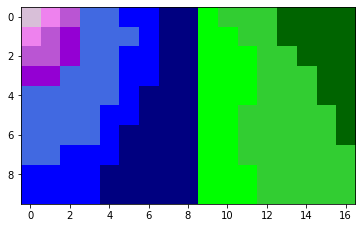

In [119]:
import matplotlib.colors as colors

cblues = ['thistle', 'violet', 'mediumorchid',
          'darkviolet', 'royalblue', 'blue',
          'navy', 'lime', 'limegreen',
          'darkgreen']
cmap = colors.ListedColormap(cblues)

# setting custom boundaries because simple normalization would not work effectively in map
boundaries = np.array([0, 0.00005, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.03, 0.1, 0.5, 1])
# multiplying values by 100000 so that they are easier whole numbers to understand on colorbar
norm = colors.BoundaryNorm(boundaries*100000, cmap.N, clip=True)

m = features_sel_date.shape[1]
n = features_sel_date.shape[0]

ims = []
fig = plt.figure()

for i in range(iterations):
    if i%500==0:
      print(i, end=" ")
    
    # select a training example at random
    t = features_sel_date[np.random.randint(0, n),]
    
    # find its Best Matching Unit
    bmu, bmu_idx = find_bmu(t, net, m)
    
    # decay the SOM parameters
    r = decay_radius(init_radius, i, time_constant)
    l = decay_learning_rate(init_lr, i, iterations)

    for x in range(net.shape[0]):
        for y in range(net.shape[1]):
            w = net[x, y, :]
            w_dist = manhattan_distance(np.array([x, y]), bmu_idx, 2)
            if w_dist <= r**2:
                influence = calculate_influence(w_dist, r)
                new_w = w + (l * influence * (t - w))
                net[x, y, :] = new_w
                
    # for animations
    #'''
    if i%10==0:
      output = np.sum(net, axis=2)
      im = plt.imshow((output/np.max(output))*100000, animated=True, cmap=cmap, norm=norm)
      ims.append([im])
    #'''

View visualization of SOM:

In [120]:
ani = animation.ArtistAnimation(fig, ims, interval=10, blit=True,
                               repeat_delay=1000)


rc('animation', html='jshtml')
ani

In [21]:
!pip install --upgrade geopandas
import zipfile

with zipfile.ZipFile("Countries_WGS84.zip","r") as zip_ref:
    zip_ref.extractall()

Requirement already up-to-date: geopandas in /usr/local/lib/python3.6/dist-packages (0.7.0)


In [0]:
import geopandas

countries = geopandas.read_file('Countries_WGS84.shp')

Renaming countries in our csv dataframe so they match that of the geopandas dataframe:

In [0]:
regions[regions.index('Bahamas')] = 'Bahamas, The'
regions[regions.index('Burma')] = 'Myanmar (Burma)'
regions[regions.index('Cabo Verde')] = 'Cape Verde'
regions[regions.index('Congo (Brazzaville)')] = 'Congo'
regions[regions.index('Congo (Kinshasa)')] = 'Congo'
regions[regions.index('Cote d\'Ivoire')] = 'Ivory Coast'
regions[regions.index('Czechia')] = 'Czech Republic'
regions[regions.index('Eswatini')] = 'Swaziland'
regions[regions.index('Gambia')] = 'Gambia, The'
regions[regions.index('Korea, South')] = 'South Korea'
# disputed state
regions[regions.index('Kosovo')] = 'Serbia'
regions[regions.index('North Macedonia')] = 'Macedonia'
regions[regions.index('South Sudan')] = 'Sudan'
regions[regions.index('Taiwan*')] = 'Taiwan'
regions[regions.index('Tanzania')] = 'Tanzania, United Republic of'
regions[regions.index('US')] = 'United States'
regions[regions.index('West Bank and Gaza')] = 'Gaza Strip'
regions[regions.index('Saint Kitts and Nevis')] = 'St. Kitts and Nevis'
regions[regions.index('Saint Lucia')] = 'St. Lucia'
regions[regions.index('Saint Vincent and the Grenadines')] = 'St. Vincent and the Grenadines'
regions[regions.index('Belarus')] = 'Byelarus'



In [0]:
# running the following loop tells us what countries we needed to rename and which are absent from 
# the shapefile
exc = ['Diamond Princess', 'Holy See', 'MS Zaandam', 'Timor-Leste']
for i in regions:
  if i not in exc:
    list(countries['CNTRY_NAME']).index(i)

In [0]:
def find(lst, el):
  ret_val = -1
  try:
    ret_val = lst.index(el)
  except:
    ret_val = -1
  return ret_val


In [0]:
# create column for geopandas dataframe of countries
def create_col(features, regions, countries, net):
  col = []
  for i in range(len(countries['CNTRY_NAME'])):
    j = find(regions, countries['CNTRY_NAME'][i])
    if j != -1 and regions[j] not in exc and j < len(features):
      x = find_bmu(features[j], net, 3)[1]
      col.append(np.sum(net, axis=2)[x[0], x[1]])
    else:
      col.append(0)
  return col

In [121]:
col = create_col(getEntriesPerDate(dates[0]), regions, countries, net)
countries['COVID'] = (col/np.max(col))*100000

Date selected: 2020-01-22


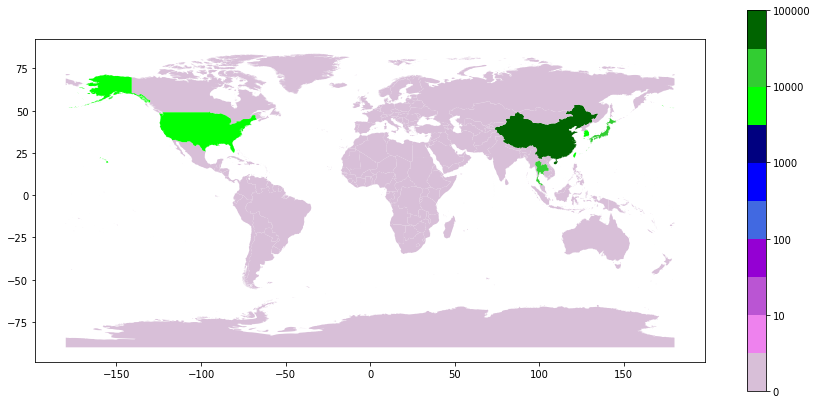

In [122]:
countries.plot(column='COVID', legend=True, figsize=(15, 7), cmap=cmap, norm=norm)

# Visualization of cases through time:

In [123]:
# list of indices for each date
indiv_dates = list(dict.fromkeys(dates))
all_cols = []

for i in range(len(indiv_dates)):
  all_cols.append(create_col(getEntriesPerDate(indiv_dates[i]), regions, countries, net))


Date selected: 2020-01-22
Date selected: 2020-01-23
Date selected: 2020-01-24
Date selected: 2020-01-25
Date selected: 2020-01-26
Date selected: 2020-01-27
Date selected: 2020-01-28
Date selected: 2020-01-29
Date selected: 2020-01-30
Date selected: 2020-01-31
Date selected: 2020-02-01
Date selected: 2020-02-02
Date selected: 2020-02-03
Date selected: 2020-02-04
Date selected: 2020-02-05
Date selected: 2020-02-06
Date selected: 2020-02-07
Date selected: 2020-02-08
Date selected: 2020-02-09
Date selected: 2020-02-10
Date selected: 2020-02-11
Date selected: 2020-02-12
Date selected: 2020-02-13
Date selected: 2020-02-14
Date selected: 2020-02-15
Date selected: 2020-02-16
Date selected: 2020-02-17
Date selected: 2020-02-18
Date selected: 2020-02-19
Date selected: 2020-02-20
Date selected: 2020-02-21
Date selected: 2020-02-22
Date selected: 2020-02-23
Date selected: 2020-02-24
Date selected: 2020-02-25
Date selected: 2020-02-26
Date selected: 2020-02-27
Date selected: 2020-02-28
Date selecte

In [0]:
# list of indices for each date
indiv_dates = list(dict.fromkeys(dates))
for i in range(len(indiv_dates)):
  # normalize values and bring to scale
  i_col = (all_cols[i]/np.max(all_cols))*100000
  countries['COVID'+str(i)] = i_col
  countries.plot(column='COVID'+str(i), legend=True, figsize=(15, 7), cmap=cmap, norm=norm)
  plt.title('Date: '+indiv_dates[i])
  plt.savefig(str(i)+'.png')
  plt.close()


Load plots and visualize

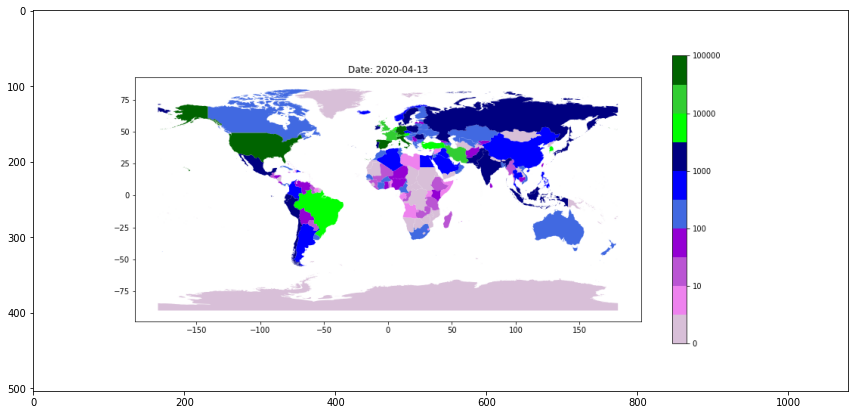

In [125]:
timeseries = []
fig3 = plt.figure(figsize=(15, 7))

for i in range(len(indiv_dates)):
  img = plt.imshow(plt.imread(str(i)+'.png'), animated=True)
  timeseries.append([img])

In [126]:
ani2 = animation.ArtistAnimation(fig3, timeseries, interval=180, blit=True,
                               repeat_delay=1000)
 
rc('animation', html='jshtml')
ani2